In [1]:
from __future__ import division, print_function
import sys, os, glob, time, warnings, gc
import numpy as np
import matplotlib.pyplot as plt
from astropy.table import Table, vstack, hstack, join
import fitsio
# from astropy.io import fits

from scipy.stats import kstest
from scipy.interpolate import interp1d

In [2]:
def load_fiberstats_by_tracer(tracer='ELG'): # reusing code from Rongpu https://data.desi.lbl.gov/desi/users/rongpu/redshift_qa/nz_ks_test/bad_fibers_from_nz-elg-zcatalog.html
    min_nobs = 50

    cat = Table(fitsio.read('/global/cfs/cdirs/desicollab/users/rongpu/redshift_qa/jura_data/{}.fits'.format(tracer.lower())))


    cat['EFFTIME_BGS'] = 0.1400 * cat['TSNR2_BGS']
    cat['EFFTIME_LRG'] = 12.15 * cat['TSNR2_LRG']

    # Remove FIBERSTATUS!=0 fibers
    mask = cat['COADD_FIBERSTATUS']==0
    print('FIBERSTATUS   ', np.sum(~mask), np.sum(mask), np.sum(~mask)/len(mask))
    cat = cat[mask]

    # Remove "no data" fibers
    mask = cat['ZWARN'] & 2**9==0
    print('No data   ', np.sum(~mask), np.sum(mask), np.sum(~mask)/len(mask))
    cat = cat[mask]

    # Require a minimum depth for the cat coadd
    if tracer=='BGS_ANY':
        min_depth = 160
        mask = cat['EFFTIME_BGS']>min_depth
    else:
        min_depth = 800.
        mask = cat['EFFTIME_LRG']>min_depth
    print('Min depth   ', np.sum(~mask), np.sum(mask), np.sum(~mask)/len(mask))
    cat = cat[mask]

    if tracer=='LRG':
        # Apply maskbits
        maskbits = [1, 8, 9, 11, 12, 13]
        mask = np.ones(len(cat), dtype=bool)
        for bit in maskbits:
            mask &= (cat['MASKBITS'] & 2**bit)==0
        print('MASKBITS  ', np.sum(~mask), np.sum(mask), np.sum(~mask)/len(mask))
        cat = cat[mask]
    elif tracer=='ELG':
        # Apply maskbits
        maskbits = [1, 11, 12, 13]
        mask = np.ones(len(cat), dtype=bool)
        for bit in maskbits:
            mask &= (cat['MASKBITS'] & 2**bit)==0
        print('MASKBITS  ', np.sum(~mask), np.sum(mask), np.sum(~mask)/len(mask))
        cat = cat[mask]
        
    
    fibers = list(set(cat['FIBER']))

    cat_fibers = {}

    for fiber in fibers:
        ii = cat['FIBER']==fiber
        cat_fibers[fiber] = cat[ii] 
    return cat_fibers

In [3]:
elg_cat_fibers = load_fiberstats_by_tracer(tracer='ELG')
lrg_cat_fibers = load_fiberstats_by_tracer(tracer='LRG')
qso_cat_fibers = load_fiberstats_by_tracer(tracer='QSO')
bgs_cat_fibers = load_fiberstats_by_tracer(tracer='BGS_ANY')

FIBERSTATUS    264198 15709044 0.016540036142944557
No data    0 15709044 0.0
Min depth    587803 15121241 0.037418126780980436
MASKBITS   613801 14507440 0.04059197257685398
FIBERSTATUS    113487 6146815 0.018128039190441612
No data    0 6146815 0.0
Min depth    245309 5901506 0.039908310238717125
MASKBITS   440588 5460918 0.07465687571951973
FIBERSTATUS    100029 5287743 0.018565930406854635
No data    0 5287743 0.0
Min depth    207773 5079970 0.03929332420278368
FIBERSTATUS    245744 13618308 0.01772526531204586
No data    0 13618308 0.0
Min depth    492687 13125621 0.036178282940876355


In [54]:
n_percentiles = 30

data_sets = [bgs_cat_fibers, lrg_cat_fibers, elg_cat_fibers, qso_cat_fibers]
labels = ['BGS', 'LRG', 'ELG', 'QSO']

all_percentiles = {}
all_lens = {}
cat_fibers = {}
for i, (data, label) in enumerate(zip(data_sets, labels)):
    percentiles = []
    lens = []
    cat_fibers[label] = data
    for j in sorted(data.keys()):
        percent = np.percentile(data[j]['Z'], q=np.linspace(0,100,n_percentiles))
        percentiles.append(percent)
        lens.append(len(data[j]['Z']))
    percentiles_array = np.array(percentiles)
    lens_array = np.array(lens)
    
    all_percentiles[label] = percentiles_array
    all_lens[label] = lens_array


In [46]:
import numpy as np
import matplotlib.pyplot as plt

def analyze_fiber_outliers(all_percentiles_array, all_lens_array, threshold_factor=3.0, min_items=200, plot=True):
    """
    Analyze fiber outliers based on percentile data, considering a minimum number of items per fiber.

    Parameters:
    all_percentiles_array (np.array): Array of percentile data for each fiber.
                                      Shape: (n_fibers, n_percentiles)
    all_lens_array (np.array): Array of the number of items for each fiber.
                               Shape: (n_fibers,)
    threshold_factor (float): Factor to multiply std deviation for outlier threshold.
    min_items (int): Minimum number of items a fiber must have to be considered for outlier detection.
    plot (bool): Whether to generate plots.

    Returns:
    dict: Dictionary containing analysis results and outlier information.
    """
    # Compute mean and standard deviation across all fibers
    mean_percentiles = np.mean(all_percentiles_array, axis=0)
    std_percentiles = np.std(all_percentiles_array, axis=0)

    # Compute normalized deviation score for each fiber
    def compute_deviation_score(fiber_percentiles):
        normalized_diff = (fiber_percentiles - mean_percentiles) / std_percentiles
        return np.sqrt(np.mean(normalized_diff**2))

    deviation_scores = np.array([compute_deviation_score(fiber) for fiber in all_percentiles_array])

    # Identify outliers, considering only fibers with minimum number of items
    mask_min_items = all_lens_array >= min_items
    valid_deviation_scores = deviation_scores[mask_min_items]
    
    deviation_mean = np.mean(valid_deviation_scores)
    deviation_std = np.std(valid_deviation_scores)
    outlier_threshold = deviation_mean + threshold_factor * deviation_std
    
    outliers = np.where((deviation_scores > outlier_threshold) & mask_min_items)[0]

    # Prepare results
    results = {
        "mean_percentiles": mean_percentiles,
        "std_percentiles": std_percentiles,
        "deviation_scores": deviation_scores,
        "outlier_threshold": outlier_threshold,
        "outliers": outliers,
        "top_outliers": sorted([(i, score) for i, score in enumerate(deviation_scores) 
                                if all_lens_array[i] >= min_items], 
                               key=lambda x: x[1], reverse=True)[:10]
    }

    if plot:
        plot_results(all_percentiles_array, all_lens_array, results, min_items)

    return results

def plot_results(all_percentiles_array, all_lens_array, results, min_items):
    """
    Generate plots for the fiber outlier analysis.
    """
    fig, axs = plt.subplots(2, 2, figsize=(15, 15))

    # Plot 1: All percentile curves with mean and std
    ax = axs[0, 0]
    for percentiles, length in zip(all_percentiles_array, all_lens_array):
        color = 'blue' if length >= min_items else 'gray'
        alpha = 0.5 if length >= min_items else 0.1
        ax.plot(percentiles, color=color, alpha=alpha)
    ax.plot(results["mean_percentiles"], color='red', linewidth=2, label='Mean')
    ax.plot(results["mean_percentiles"] + results["std_percentiles"], color='green', linestyle='--', label='+1 Std')
    ax.plot(results["mean_percentiles"] - results["std_percentiles"], color='green', linestyle='--', label='-1 Std')
    ax.set_title('Percentile Curves')
    ax.set_xlabel('Percentile Index')
    ax.set_ylabel('Z Value')
    ax.legend()

    # Plot 2: Histogram of deviation scores
    ax = axs[0, 1]
    ax.hist(results["deviation_scores"][all_lens_array >= min_items], bins=50, alpha=0.7, label=f'≥{min_items} items')
    ax.hist(results["deviation_scores"][all_lens_array < min_items], bins=50, alpha=0.3, label=f'<{min_items} items')
    ax.axvline(results["outlier_threshold"], color='red', linestyle='--', label='Outlier Threshold')
    ax.set_title('Histogram of Deviation Scores')
    ax.set_xlabel('Deviation Score')
    ax.set_ylabel('Count')
    ax.legend()

    # Plot 3: Scatter plot of deviation scores vs number of items
    ax = axs[1, 0]
    scatter = ax.scatter(all_lens_array, results["deviation_scores"], c=results["deviation_scores"], cmap='viridis', alpha=0.5)
    ax.axhline(results["outlier_threshold"], color='red', linestyle='--', label='Outlier Threshold')
    ax.axvline(min_items, color='green', linestyle='--', label='Minimum Items Threshold')
    ax.set_title('Deviation Scores vs Number of Items')
    ax.set_xlabel('Number of Items')
    ax.set_ylabel('Deviation Score')
    ax.set_xscale('log')
    ax.legend()
    plt.colorbar(scatter, ax=ax, label='Deviation Score')

    # Plot 4: Percentile curves of outliers
    ax = axs[1, 1]
    for i in results["outliers"]:
        ax.plot(all_percentiles_array[i], color='red', alpha=0.5)
    ax.plot(results["mean_percentiles"], color='blue', linewidth=2, label='Mean')
    ax.set_title(f'Percentile Curves of Outliers (n={len(results["outliers"])})')
    ax.set_xlabel('Percentile Index')
    ax.set_ylabel('Z Value')
    ax.legend()

    plt.tight_layout()
    plt.show()

# Example usage:
# results = analyze_fiber_outliers(all_percentiles['BGS'], all_lens['BGS'], threshold_factor=2.0, min_items=50)

# Print summary
# print(f"Number of fibers: {len(all_percentiles['BGS'])}")
# print(f"Number of fibers with ≥{min_items} items: {np.sum(all_lens['BGS'] >= min_items)}")
# print(f"Number of outliers detected: {len(results['outliers'])}")
# print(f"Outlier threshold: {results['outlier_threshold']:.4f}")
# print("\nTop 10 outliers (index, score):")
# for idx, score in results['top_outliers']:
#     print(f"Fiber index {idx} (items: {all_lens['BGS'][idx]}): {score:.4f}")

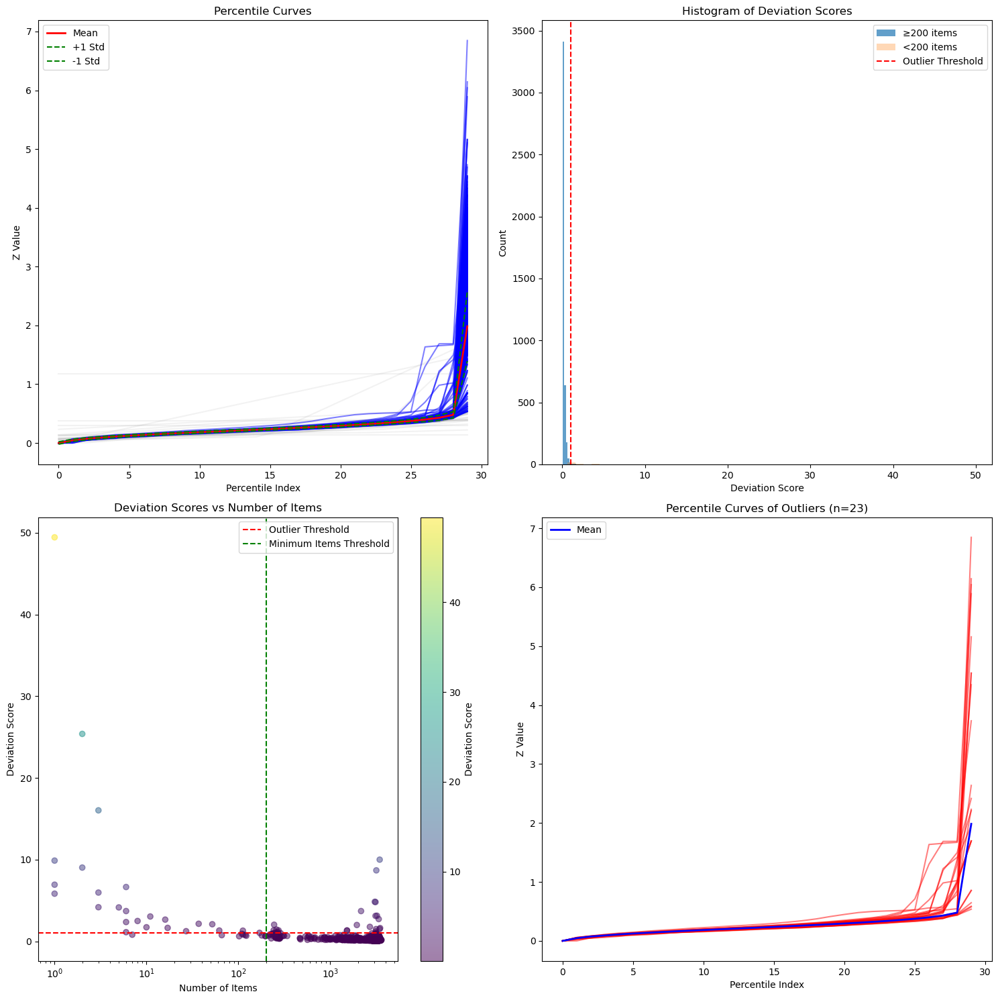

RESULTS FOR BGS
 {'mean_percentiles': array([-6.69304857e-05,  4.60736119e-02,  7.34652100e-02,  9.15396871e-02,
        1.09498872e-01,  1.24220292e-01,  1.37258695e-01,  1.49731182e-01,
        1.61775851e-01,  1.73335870e-01,  1.84264030e-01,  1.94842845e-01,
        2.05308084e-01,  2.15977139e-01,  2.26491858e-01,  2.37000563e-01,
        2.47972969e-01,  2.59015145e-01,  2.70265326e-01,  2.82161924e-01,
        2.94808662e-01,  3.08267605e-01,  3.22656058e-01,  3.38183108e-01,
        3.55342872e-01,  3.74953365e-01,  3.98834081e-01,  4.29528099e-01,
        4.78979832e-01,  1.98515640e+00]), 'std_percentiles': array([0.02020922, 0.01923913, 0.01838816, 0.01804799, 0.01772093,
       0.01744957, 0.01728292, 0.0171923 , 0.01714153, 0.01713333,
       0.01713611, 0.01722546, 0.01734547, 0.01746791, 0.0175834 ,
       0.01768764, 0.01783799, 0.01814568, 0.01855915, 0.01913313,
       0.01983113, 0.02061433, 0.02147689, 0.0223804 , 0.02355738,
       0.02555503, 0.0357532 , 0.0436612

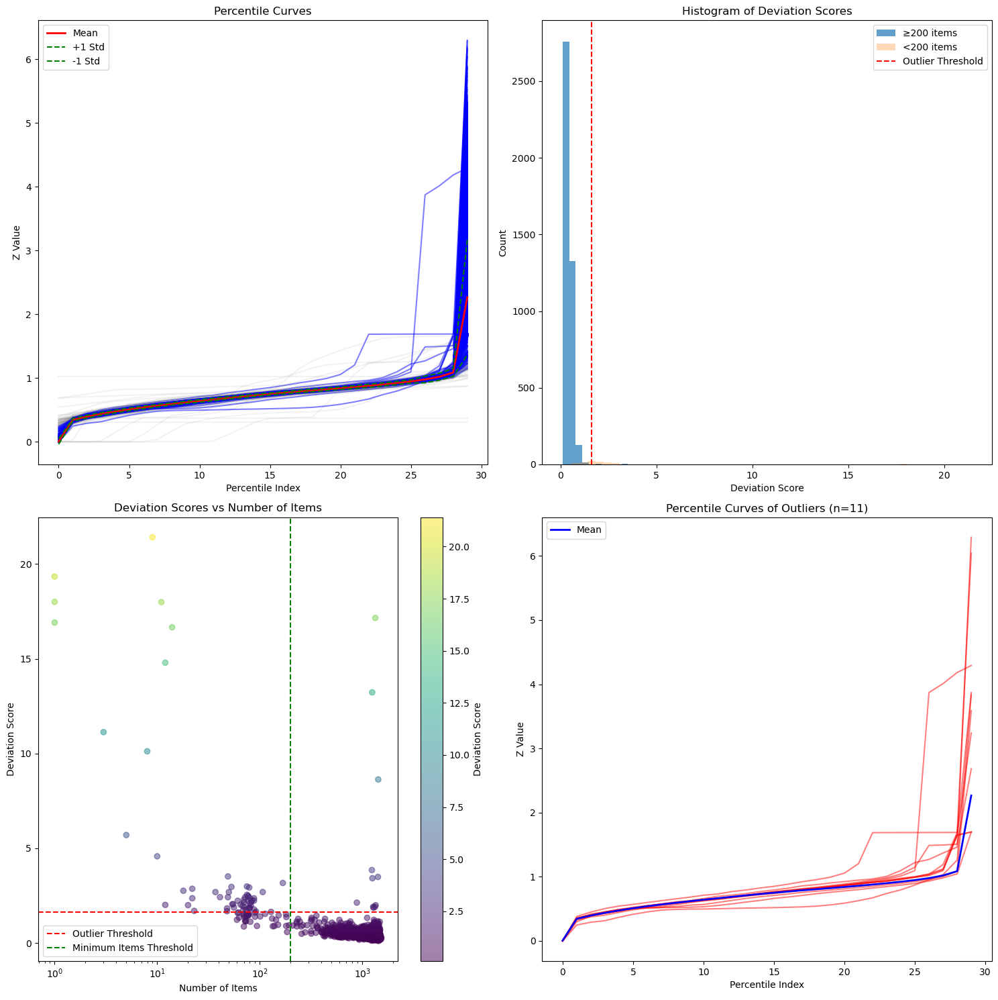

RESULTS FOR LRG
 {'mean_percentiles': array([0.00590881, 0.34448795, 0.39504847, 0.43723831, 0.47469438,
       0.50851053, 0.53918527, 0.56695544, 0.59286676, 0.61741667,
       0.64092726, 0.6639917 , 0.68646974, 0.70841414, 0.72985064,
       0.75030716, 0.76978359, 0.78802928, 0.80513226, 0.82246503,
       0.8403617 , 0.8588168 , 0.87828452, 0.89909322, 0.92176425,
       0.94707126, 0.97796713, 1.01897174, 1.08672409, 2.26608282]), 'std_percentiles': array([0.04322954, 0.02148788, 0.02052477, 0.02122297, 0.02120325,
       0.0211029 , 0.02051741, 0.01982336, 0.01895417, 0.01869568,
       0.01884533, 0.01866839, 0.01783719, 0.01735229, 0.01681847,
       0.01653269, 0.0168541 , 0.01775793, 0.0188368 , 0.01891015,
       0.01940741, 0.02059386, 0.02425874, 0.02436058, 0.02482872,
       0.02594743, 0.05205034, 0.05425529, 0.06058322, 0.90106085]), 'deviation_scores': array([0.47993668, 0.40795593, 0.45860838, ..., 0.24024148, 0.7106005 ,
       0.31416131]), 'outlier_threshold': 1

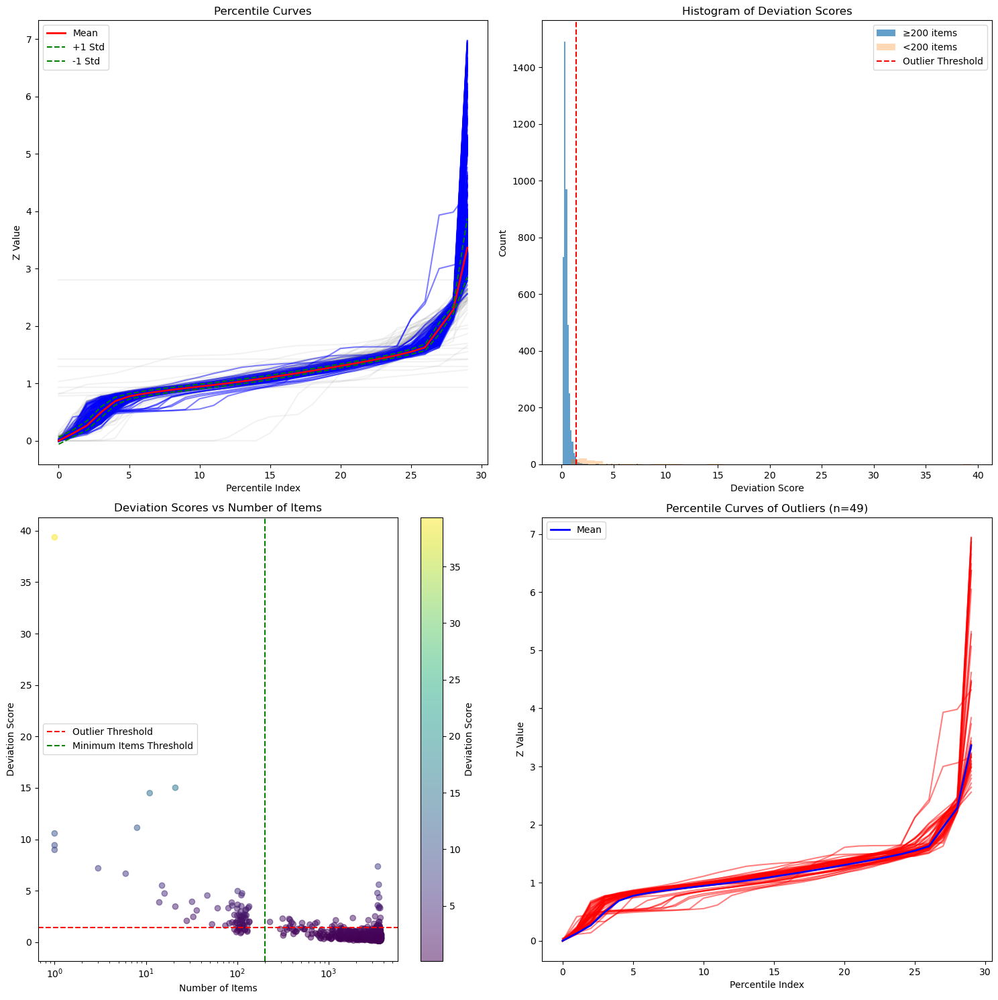

RESULTS FOR ELG
 {'mean_percentiles': array([6.34294554e-04, 1.27754874e-01, 2.65326749e-01, 4.96314734e-01,
       6.89216861e-01, 7.73828811e-01, 8.19074938e-01, 8.54910554e-01,
       8.86723740e-01, 9.16406840e-01, 9.44563985e-01, 9.72718368e-01,
       1.00213965e+00, 1.03368523e+00, 1.06785375e+00, 1.10407164e+00,
       1.14183402e+00, 1.18050275e+00, 1.22002386e+00, 1.26111556e+00,
       1.30417392e+00, 1.34711061e+00, 1.39191732e+00, 1.43969624e+00,
       1.49008439e+00, 1.55050372e+00, 1.62591483e+00, 1.95344013e+00,
       2.28121832e+00, 3.36322827e+00]), 'std_percentiles': array([0.06017005, 0.05987144, 0.08020429, 0.09409617, 0.06925853,
       0.04730749, 0.04355226, 0.04243884, 0.04169363, 0.04119409,
       0.04066668, 0.04034671, 0.04012965, 0.0399094 , 0.04004461,
       0.03907046, 0.03758872, 0.03634211, 0.03525524, 0.03454266,
       0.03400592, 0.03381288, 0.03398405, 0.03407939, 0.03658104,
       0.04383804, 0.056553  , 0.0992967 , 0.06516993, 0.51080757]), '

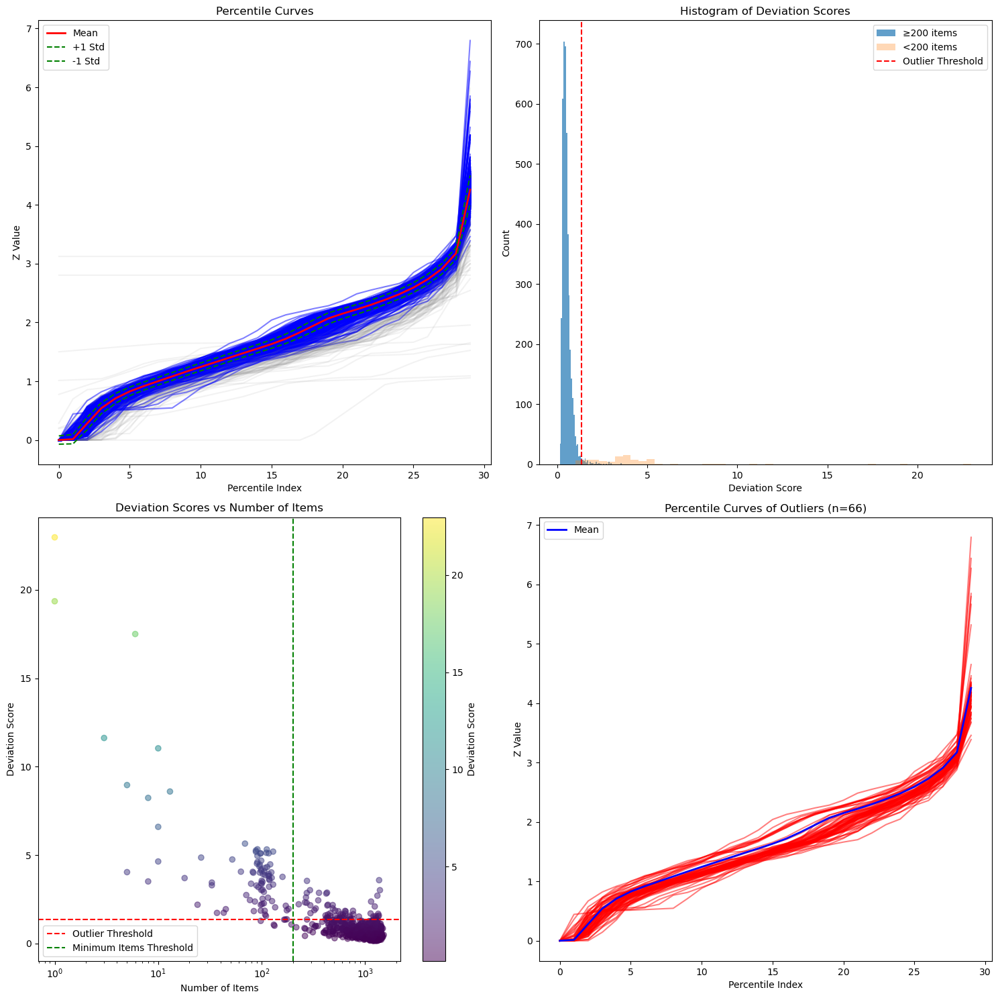

RESULTS FOR QSO
 {'mean_percentiles': array([3.52211389e-04, 1.48922390e-02, 2.82561027e-01, 5.42741761e-01,
       7.09471236e-01, 8.27168159e-01, 9.18849274e-01, 1.00143715e+00,
       1.08296861e+00, 1.16476912e+00, 1.24356177e+00, 1.32165350e+00,
       1.39972213e+00, 1.47761137e+00, 1.55406888e+00, 1.63304917e+00,
       1.72219476e+00, 1.83179332e+00, 1.95143736e+00, 2.06916816e+00,
       2.14944741e+00, 2.22201541e+00, 2.29961690e+00, 2.38518838e+00,
       2.48017940e+00, 2.59295343e+00, 2.73310535e+00, 2.91005411e+00,
       3.17432759e+00, 4.25783971e+00]), 'std_percentiles': array([0.07074295, 0.07923357, 0.10560155, 0.09195034, 0.08428828,
       0.0732073 , 0.06813491, 0.06643613, 0.0664195 , 0.06637131,
       0.06648042, 0.06647474, 0.06729238, 0.06752952, 0.06856958,
       0.07111561, 0.080146  , 0.08936685, 0.09730148, 0.09444225,
       0.08597178, 0.08279595, 0.08119449, 0.07963932, 0.08064724,
       0.08245879, 0.08504938, 0.08866011, 0.09891839, 0.24436639]), '

In [47]:
labels = ['BGS', 'LRG', 'ELG', 'QSO']
outlier_results = {}
for l in labels:
    outlier_results[l] = analyze_fiber_outliers(all_percentiles[l], all_lens[l])
    print('RESULTS FOR {}\n {}'.format(l,outlier_results[l]))
    print('')

In [56]:
import numpy as np
from functools import reduce

def find_common_outliers(all_percentiles, all_lens, cat_fibers, labels, threshold_factor=2.0, min_items=50):
    """
    Analyze outliers for each label and find common outliers across all labels,
    considering a minimum number of items per fiber.
    
    Parameters:
    all_percentiles (dict): Dictionary with labels as keys and percentile arrays as values
    all_lens (dict): Dictionary with labels as keys and length arrays as values
    cat_fibers (dict): Dictionary with labels as keys and catalog fiber dictionaries as values
    labels (list): List of labels to analyze
    threshold_factor (float): Factor to multiply std deviation for outlier threshold
    min_items (int): Minimum number of items a fiber must have to be considered for outlier detection
    
    Returns:
    dict: Dictionary containing analysis results and common outliers
    """
    outlier_results = {}
    outlier_sets = {}
    fiber_id_maps = {}
    
    for label in labels:
        # Create a mapping from index to fiber ID
        fiber_ids = sorted(cat_fibers[label].keys())
        fiber_id_maps[label] = fiber_ids
        
        outlier_results[label] = analyze_fiber_outliers(
            all_percentiles[label], 
            all_lens[label], 
            threshold_factor=threshold_factor, 
            min_items=min_items, 
            plot=False
        )
        outlier_sets[label] = set(outlier_results[label]['outliers'])
        
        print(f'RESULTS FOR {label}')
        print(f"Total fibers: {len(all_percentiles[label])}")
        print(f"Fibers with ≥{min_items} items: {np.sum(all_lens[label] >= min_items)}")
        print(f"Number of outliers: {len(outlier_sets[label])}")
        print(f"Outlier threshold: {outlier_results[label]['outlier_threshold']:.4f}")
        print("Top 5 outliers (index, fiber ID, score, items):")
        for idx, score in outlier_results[label]['top_outliers'][:5]:
            fiber_id = fiber_ids[idx]
            print(f"Index {idx}, Fiber ID {fiber_id} (items: {all_lens[label][idx]}): {score:.4f}")
        print("Sorted list of outlier Fiber IDs:")
        print(", ".join(str(fiber_ids[idx]) for idx in sorted(outlier_sets[label], key=lambda x: fiber_ids[x])))
        print('')
    
    # Find common outliers
    common_outlier_indices = reduce(set.intersection, outlier_sets.values())
    
    # Get scores, lengths, and fiber IDs for common outliers
    common_outlier_info = {label: {} for label in labels}
    for label in labels:
        for idx in common_outlier_indices:
            fiber_id = fiber_id_maps[label][idx]
            common_outlier_info[label][fiber_id] = {
                'index': idx,
                'score': outlier_results[label]['deviation_scores'][idx],
                'items': all_lens[label][idx]
            }
    
    # Get the set of common outlier fiber IDs
    common_outlier_fiber_ids = set.intersection(*(set(info.keys()) for info in common_outlier_info.values()))
    
    return {
        'outlier_results': outlier_results,
        'common_outlier_indices': common_outlier_indices,
        'common_outlier_fiber_ids': common_outlier_fiber_ids,
        'common_outlier_info': common_outlier_info
    }

# Example usage:
# labels = ['BGS', 'LRG', 'ELG', 'QSO']
# results = find_common_outliers(all_percentiles, all_lens, cat_fibers, labels, threshold_factor=2.0, min_items=50)

# print("\nCommon outliers across all labels:")
# print(f"Number of common outliers: {len(results['common_outlier_fiber_ids'])}")
# print("\nSorted list of common outlier Fiber IDs:")
# print(", ".join(str(fiber_id) for fiber_id in sorted(results['common_outlier_fiber_ids'])))
# print("\nCommon outlier details:")
# for fiber_id in sorted(results['common_outlier_fiber_ids']):
#     print(f"Fiber ID {fiber_id}:")
#     for label in labels:
#         info = results['common_outlier_info'][label][fiber_id]
#         print(f"  {label} - index: {info['index']}, score: {info['score']:.4f}, items: {info['items']}")
#     print('')

# The plot_common_outliers function remains the same as in the previous version

RESULTS FOR BGS
Total fibers: 4347
Fibers with ≥200 items: 4312
Number of outliers: 23
Outlier threshold: 1.0587
Top 5 outliers (index, fiber ID, score, items):
Index 3456, Fiber ID 3994 (items: 3453): 10.0082
Index 881, Fiber ID 1008 (items: 3174): 8.6971
Index 501, Fiber ID 552 (items: 3055): 4.8492
Index 502, Fiber ID 553 (items: 3112): 4.8161
Index 4252, Fiber ID 4891 (items: 2165): 3.7151
Sorted list of outlier Fiber IDs:
466, 487, 552, 553, 651, 725, 1008, 1098, 1512, 1760, 1880, 2107, 2869, 3123, 3234, 3250, 3504, 3969, 3994, 4000, 4094, 4456, 4891

RESULTS FOR LRG
Total fibers: 4332
Fibers with ≥200 items: 4238
Number of outliers: 11
Outlier threshold: 1.6307
Top 5 outliers (index, fiber ID, score, items):
Index 3061, Fiber ID 3504 (items: 1340): 17.1583
Index 881, Fiber ID 1008 (items: 1248): 13.2289
Index 3442, Fiber ID 3994 (items: 1430): 8.6325
Index 501, Fiber ID 552 (items: 1240): 3.8527
Index 2836, Fiber ID 3250 (items: 1420): 3.4889
Sorted list of outlier Fiber IDs:
552

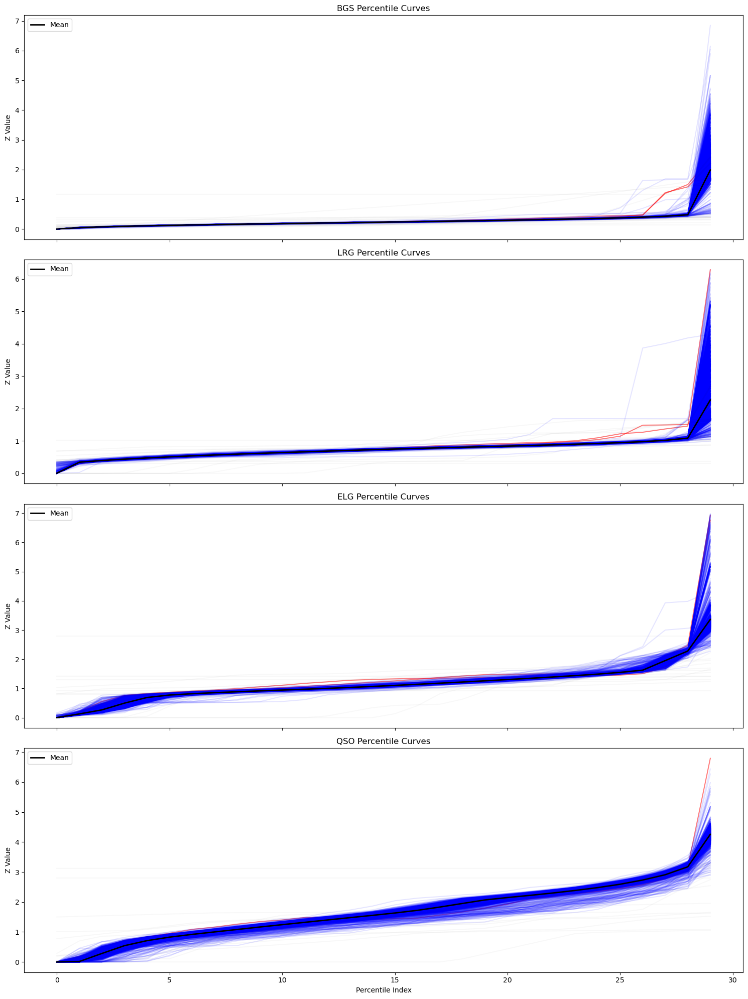

In [57]:
labels = ['BGS', 'LRG', 'ELG', 'QSO']
results = find_common_outliers(all_percentiles, all_lens, cat_fibers, labels, threshold_factor=3.0, min_items=200)

print("\nCommon outliers across all labels:")
print(f"Number of common outliers: {len(results['common_outlier_fiber_ids'])}")
print("\nCommon outlier Fiber IDs:")
print(", ".join(str(fiber_id) for fiber_id in sorted(results['common_outlier_fiber_ids'])))
print("\nCommon outlier details:")
for fiber_id in sorted(results['common_outlier_fiber_ids']):
    print(f"Fiber ID {fiber_id}:")
    for label in labels:
        info = results['common_outlier_info'][label][fiber_id]
        print(f"  {label} - index: {info['index']}, score: {info['score']:.4f}, items: {info['items']}")
    print('')

plot_common_outliers(all_percentiles, all_lens, cat_fibers, labels, results['common_outlier_fiber_ids'], min_items=50)

In [68]:
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from matplotlib.dates import DateFormatter
from mpl_toolkits.axes_grid1 import make_axes_locatable

def plot_outlier_details_single_label(percentiles, cat_fibers, outliers, deviation_scores, label):
    """
    Generate detailed plots for each outlier fiber for a single label, using deviation scores.
    
    Parameters:
    percentiles (np.array): Array of percentiles for the given label
    cat_fibers (dict): Dictionary where keys are fiber IDs and values are catalog subsets for each fiber
    outliers (np.array): Array of outlier indices in the percentiles array
    deviation_scores (np.array): Array of deviation scores for all fibers
    label (str): Label name (e.g., 'BGS', 'LRG', 'ELG', 'QSO')
    """
    # Create a mapping from index to fiber ID
    fiber_ids = sorted(cat_fibers.keys())  # Assuming the order in percentiles matches the sorted fiber IDs
    
    # Determine overall date range
    all_dates = [datetime.strptime(str(night), '%Y%m%d') for fiber_cat in cat_fibers.values() for night in fiber_cat['LASTNIGHT']]
    datemin = min(all_dates) - timedelta(days=20)
    datemax = max(all_dates) + timedelta(days=20)

    bin_size = 0.02
    bins = np.arange(-0.01, 10, bin_size)

    for outlier_index in outliers:
        fiber_id = fiber_ids[outlier_index]
        
        if fiber_id not in cat_fibers:
            print(f"Fiber ID {fiber_id} (index {outlier_index}) not found in catalog. Skipping.")
            continue

        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 5), height_ratios=[1, 1.5])
        fig.suptitle(f'{label} - FIBER {fiber_id} ', fontsize=16)

        # Plot percentiles
        ax1.plot(percentiles[outlier_index], color='red', linewidth=2, label='Outlier Fiber')
        ax1.plot(np.mean(percentiles, axis=0), color='blue', linewidth=2, label='Mean')
        ax1.fill_between(range(len(percentiles[0])), 
                         np.mean(percentiles, axis=0) - np.std(percentiles, axis=0),
                         np.mean(percentiles, axis=0) + np.std(percentiles, axis=0),
                         color='blue', alpha=0.2, label='±1 Std Dev')
        ax1.set_title(f'{label} Percentiles')
        ax1.set_xlabel('Percentile Index')
        ax1.set_ylabel('Z Value')
        ax1.legend()

        # Plot Z values over time
        cat_fiber = cat_fibers[fiber_id]
        dates = np.array([datetime.strptime(str(night), '%Y%m%d') for night in cat_fiber['LASTNIGHT']])
        
        scatter = ax2.scatter(dates, cat_fiber['Z'], c=cat_fiber['Z'], cmap='viridis', 
                              alpha=min(0.5, 1 * 600 / len(cat_fiber)), s=4)
        ax2.set_title(f'{len(cat_fiber)} objects')
        ax2.set_xlabel('Date')
        ax2.set_ylabel('Redshift')
        ax2.set_xlim(datemin, datemax)
        
        # Format x-axis to show dates nicely
        ax2.xaxis.set_major_formatter(DateFormatter('%Y-%m-%d'))
        plt.setp(ax2.xaxis.get_majorticklabels(), rotation=45, ha='right')

        # Add colorbar
        cbar = plt.colorbar(scatter, ax=ax2)
        cbar.set_label('Redshift')

        # Add histogram of Z values
        divider = make_axes_locatable(ax2)
        axins = divider.append_axes("right", size="20%", pad=0.1)
        axins.hist(cat_fiber['Z'], bins=bins, orientation='horizontal', alpha=0.7)
        axins.set_ylim(ax2.get_ylim())
        axins.set_xlabel('Count')
        axins.set_title('Z Distribution')
        axins.tick_params(axis='y', labelleft=False)

        # Add deviation score to the plot
        score = deviation_scores[outlier_index]
        ax2.text(0.02, 0.98, f'Deviation Score: {score:.5f}', transform=ax2.transAxes, 
                 verticalalignment='top', fontsize=10, bbox=dict(facecolor='white', alpha=0.7))

        plt.tight_layout()
        plt.show()

# Example usage:
# plot_outlier_details_single_label(all_percentiles['BGS'], cat_fibers, outlier_results['BGS']['outliers'], 
#                                   outlier_results['BGS']['deviation_scores'], 'BGS')

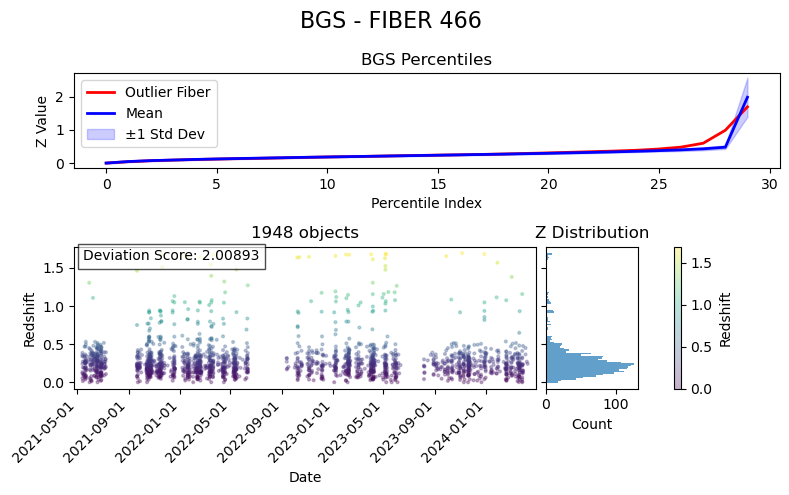

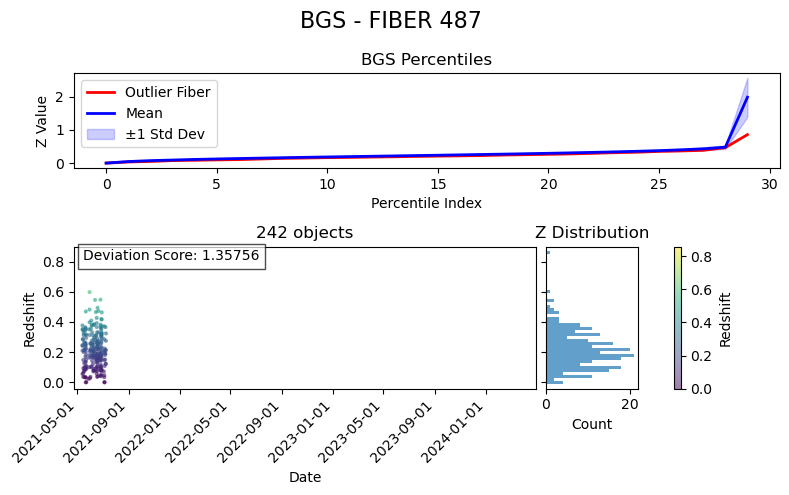

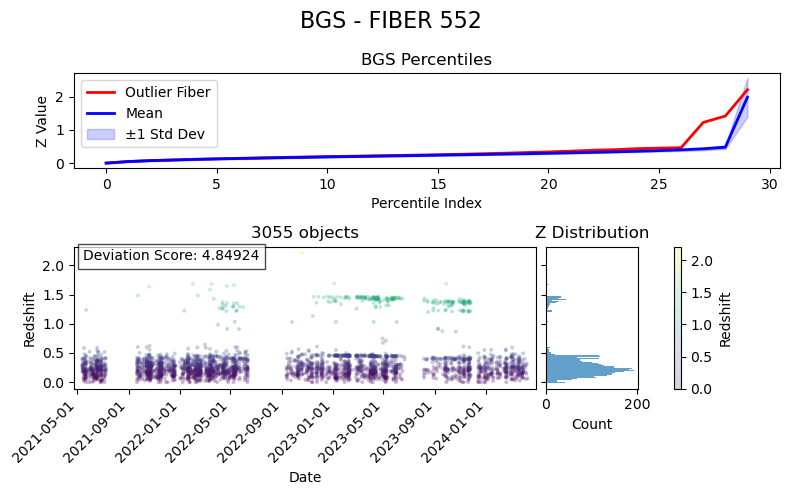

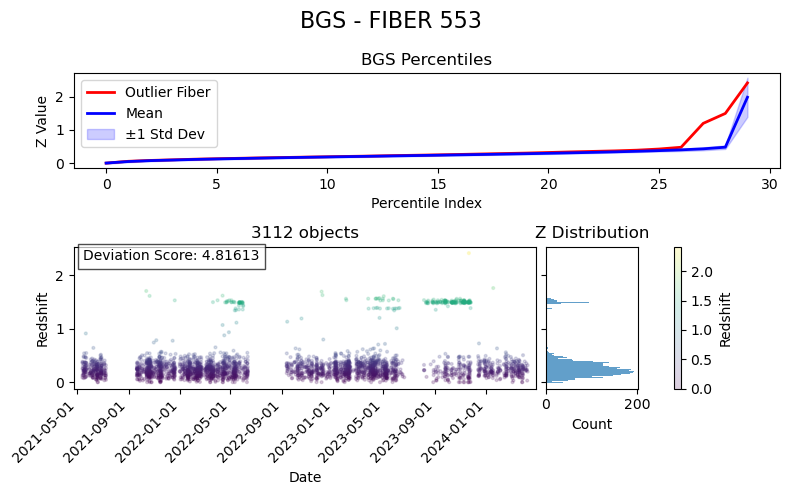

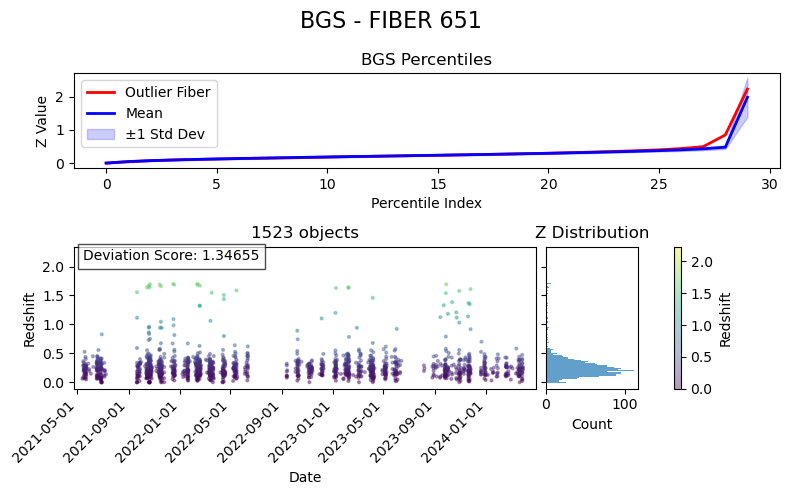

...

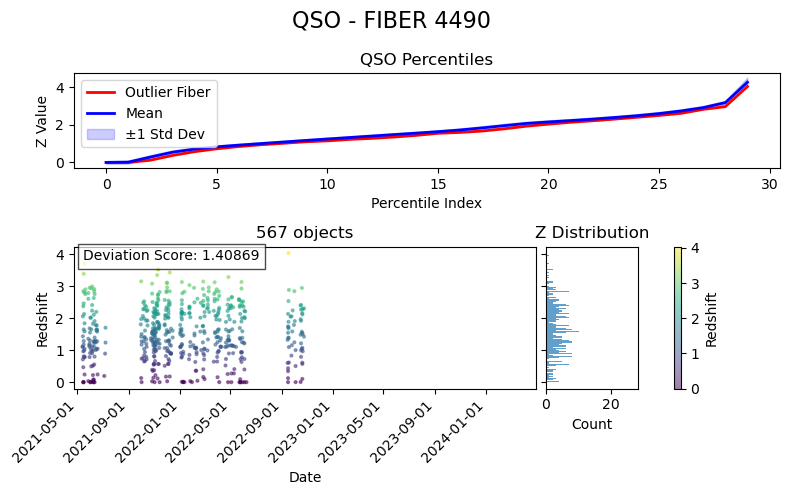

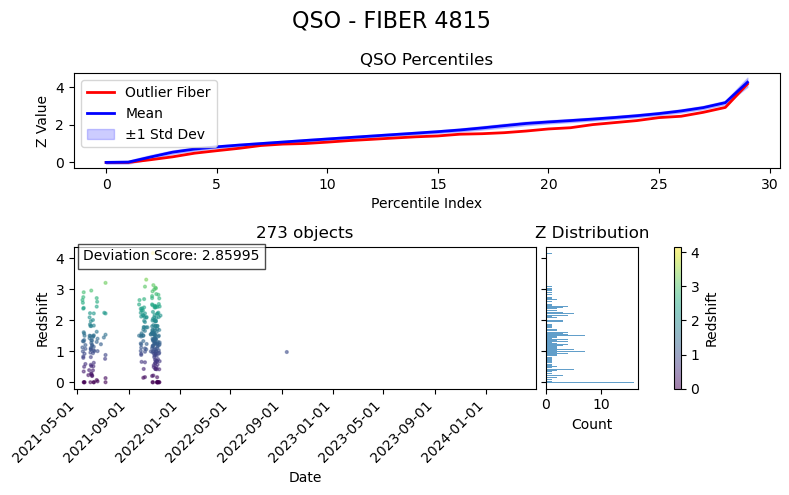

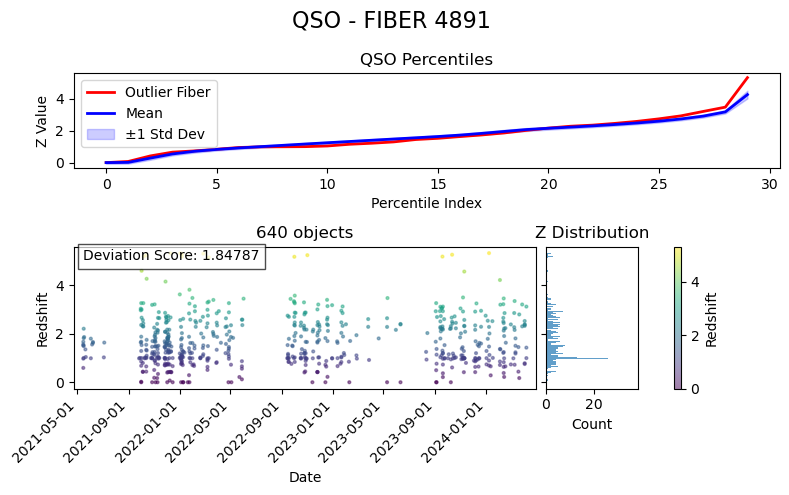

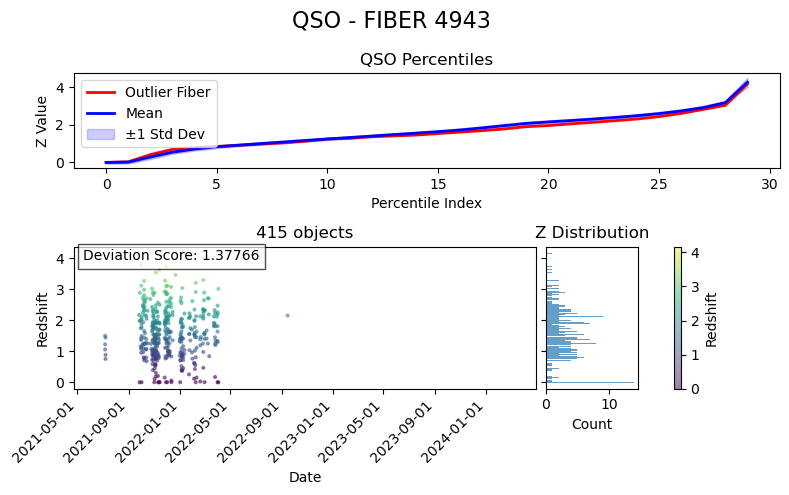

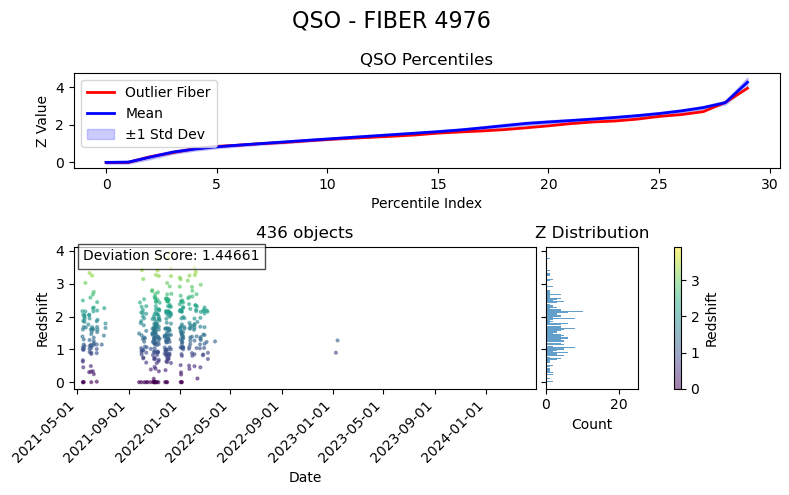

In [69]:
for l in labels:
    plot_outlier_details_single_label(all_percentiles[l], data_sets[labels.index(l)], outlier_results[l]['outliers'], outlier_results[l]['deviation_scores'], l)